In [ ]:
!pip install datashader py3dep pynhd

In [ ]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import shapely.ops as ops
import xarray as xr
# import xrspatial as xs
from datashader import transfer_functions as tf
from datashader import utils as ds_utils
from datashader.colors import Greys9, inferno
from scipy.spatial import KDTree

import py3dep
import pynhd

In [4]:
# import geemap
# import ee

# Initialize the Earth Engine module
# ee.Initialize()

# Define the region of interest (ROI) using the provided coordinates
coordinates = [
    [129.696351, 42.407487],
    [129.696351, 42.450693],
    [129.797631, 42.450693],
    [129.797631, 42.407487],
    [129.696351, 42.407487]
]
roi = ee.Geometry.Polygon(coordinates)

# Load the JAXA ALOS DSM data
alos_dsm_collection = ee.ImageCollection("JAXA/ALOS/AW3D30/V3_2")

# Mosaic the collection and clip to the ROI
alos_dsm = alos_dsm_collection.mosaic().clip(roi)

# Select the DSM band
dsm_band = alos_dsm.select('DSM')

# Create a map object
Map = geemap.Map()

# Define visualization parameters
vis_params = {
    'min': 0,
    'max': 3000,
    'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']
}

# Add the DSM band to the map object
Map.addLayer(dsm_band, vis_params, 'JAXA ALOS DSM')

# Set the map object to center on the ROI
Map.centerObject(roi, 12)

# Display the map
Map



Map(center=[42.42909866256323, 129.74699099999842], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
# Define the path and name for the downloaded file
out_file_path = "alos_dsm.tif"

# Use geemap to export the DSM band as a GeoTIFF
geemap.ee_export_image(dsm_band, filename=out_file_path, scale=30, region=roi, file_per_band=False)


## Get the DEM image

In [1]:
import ee
import geemap
geemap.ee_initialize()



In [5]:
# Create a map object
Map = geemap.Map()

# Display the map to draw a bounding box
Map



Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [8]:
# After drawing the bounding box on the map, run the following lines to get the coordinates of the bounding box
roi = Map.user_roi

if roi is None:
    print('No region of interest selected')
else:
    coordinates = roi.getInfo()['coordinates']

    # Load the JAXA ALOS DSM data
    alos_dsm_collection = ee.ImageCollection("JAXA/ALOS/AW3D30/V3_2")

    # Mosaic the collection and clip to the ROI
    alos_dsm = alos_dsm_collection.mosaic().clip(ee.Geometry.Polygon(coordinates))

    # Select the DSM band
    dsm_band = alos_dsm.select('DSM')

    # Define visualization parameters
    vis_params = {
        'min': 0,
        'max': 3000,
        'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']
    }

    # Add the DSM band to the map object
    Map.addLayer(dsm_band, vis_params, 'JAXA ALOS DSM')

    # Set the map object to center on the ROI
    Map.centerObject(ee.Geometry.Polygon(coordinates), 12)

    # Display the map
    Map


In [10]:
Map

Map(bottom=387852.0, center=[42.431565872579185, 129.7420120239258], controls=(WidgetControl(options=['positio…

In [11]:
# Define the path and name for the downloaded file
out_file_path = "alos_dsm.tif"

# Use geemap to export the DSM band as a GeoTIFF
geemap.ee_export_image(dsm_band, filename=out_file_path, scale=30, region=roi, file_per_band=False)


Generating URL ...
Please wait ...
Data downloaded to /Users/gigisung/gigi_git/undatathon/huirong/alos_dsm.tif


## Meandering River

In [8]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import shapely.ops as ops
import xarray as xr
# import xrspatial as xs
from datashader import transfer_functions as tf
from datashader import utils as ds_utils
from datashader.colors import Greys9, inferno
from scipy.spatial import KDTree
import rioxarray
import py3dep
import pynhd

In [4]:
import rasterio

# Open the TIFF file
with rasterio.open('/Users/gigisung/gigi_git/undatathon/huirong/alos_dsm.tif') as src:
    dem = src.read(1)  # Read the first band into an array

dem

array([[733, 741, 750, ..., 421, 421, 421],
       [727, 732, 742, ..., 413, 411, 411],
       [719, 729, 742, ..., 408, 405, 403],
       ...,
       [646, 652, 661, ..., 434, 433, 433],
       [652, 659, 669, ..., 434, 434, 434],
       [659, 664, 670, ..., 434, 436, 436]], dtype=int16)

In [9]:
dem = rioxarray.open_rasterio('/Users/gigisung/gigi_git/undatathon/huirong/alos_dsm.tif')

In [10]:
dem

<xarray.DataArray (band: 1, y: 473, x: 1054)>
[498542 values with dtype=int16]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 129.6 129.6 129.6 129.6 ... 129.9 129.9 129.9 129.9
  * y            (y) float64 42.5 42.49 42.49 42.49 ... 42.37 42.37 42.37 42.37
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768
    scale_factor:            1.0
    add_offset:              0.0

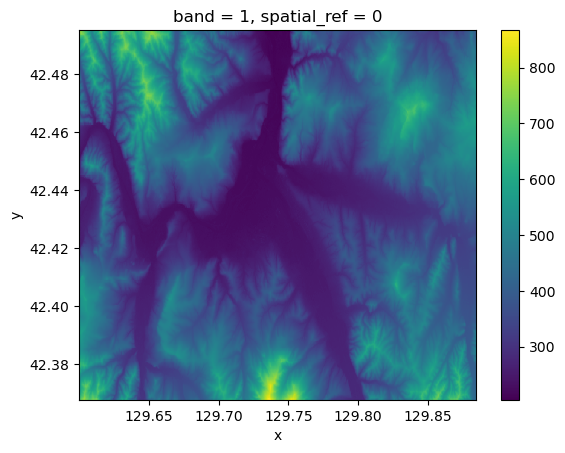

In [11]:
dem.squeeze().plot.imshow()


### Coordinates of the River

In [12]:
import osmnx as ox  

In [13]:
river = ox.geocode_to_gdf('Tumen River', which_result=1)
river = river.to_crs(dem.rio.crs)

<Axes: >

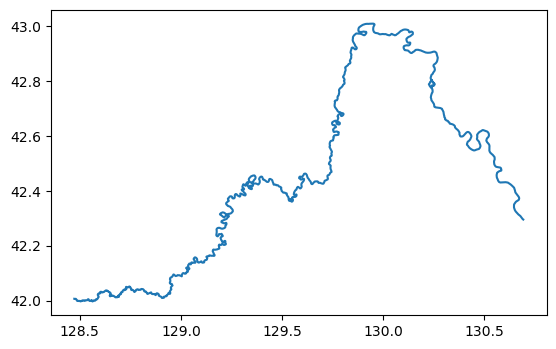

In [15]:
river.plot()

## Cut to AOI

In [17]:
dem.rio.bounds()

(129.6002155345086, 42.367782734099464, 129.8842628273472, 42.49525367291603)

In [19]:
bounds = dem.rio.bounds()
xmin, ymin, xmax, ymax = bounds

In [20]:
river = river.clip(bounds)


In [21]:
river

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTILINESTRING ((129.60022 42.43009, 129.6022...",43.008964,41.996965,130.69668,128.468102,265082051,relation,6970997,42.457876,129.622093,waterway,river,18,0.30001,river,Tumen River,"Tumen River, North Korea"


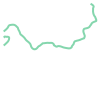

In [22]:
river_geom = river.geometry.iloc[0]
river_geom

In [78]:
dem = dem.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))
dem

<xarray.DataArray (band: 1, y: 473, x: 1054)>
[498542 values with dtype=int16]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 129.6 129.6 129.6 129.6 ... 129.9 129.9 129.9 129.9
  * y            (y) float64 42.5 42.49 42.49 42.49 ... 42.37 42.37 42.37 42.37
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768
    scale_factor:            1.0
    add_offset:              0.0

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x', ylabel='y'>

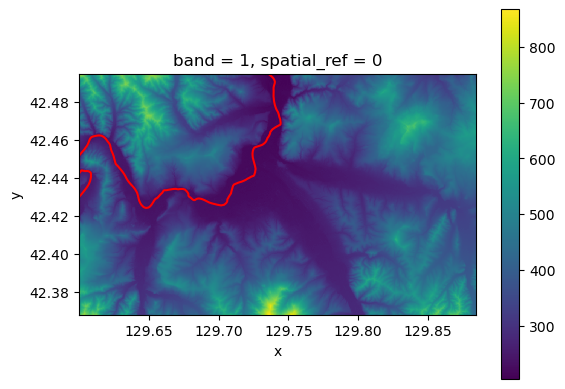

In [79]:
fig, ax = plt.subplots()
dem.squeeze().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

## Caculate the REM

### Sample

In [80]:
import shapely

def split_coords(geom):
    x = []
    y = []
    for i in shapely.get_coordinates(geom):
        x.append(i[0])
        y.append(i[1])
    return x, y
        

In [81]:
xs, ys = split_coords(river_geom)
xs, ys = xr.DataArray(xs, dims='z'), xr.DataArray(ys, dims='z')


In [82]:
sampled = dem.interp(x=xs, y=ys, method='nearest').dropna(dim='z')


In [83]:
sampled

<xarray.DataArray (band: 1, z: 227)>
array([[252., 254., 249., 254., 252., 251., 251., 252., 254., 253., 252.,
        254., 250., 251., 252., 251., 244., 245., 243., 243., 242., 241.,
        241., 243., 243., 243., 241., 241., 241., 244., 243., 244., 239.,
        243., 241., 242., 241., 243., 241., 242., 242., 242., 241., 240.,
        242., 240., 243., 240., 241., 240., 238., 240., 239., 240., 239.,
        241., 239., 240., 238., 238., 239., 237., 238., 237., 236., 238.,
        236., 237., 237., 238., 238., 237., 237., 237., 238., 238., 238.,
        235., 234., 235., 234., 234., 233., 235., 237., 236., 234., 233.,
        233., 237., 237., 234., 235., 238., 236., 235., 235., 233., 235.,
        233., 233., 239., 235., 237., 233., 232., 233., 231., 234., 234.,
        232., 229., 229., 229., 230., 230., 228., 228., 228., 228., 229.,
        229., 228., 230., 228., 228., 229., 228., 228., 229., 229., 229.,
        231., 229., 227., 227., 227., 227., 227., 226., 224., 226., 224.,
        227., 229., 230., 228., 224., 224., 225., 224., 224., 224., 224.,
        224., 221., 222., 221., 221., 219., 222., 222., 221., 220., 219.,
        219., 219., 218., 219., 220., 221., 221., 218., 220., 219., 217.,
        219., 220., 219., 219., 216., 215., 216., 219., 217., 218., 218.,
        217., 215., 219., 219., 218., 216., 216., 216., 215., 218., 219.,
        214., 214., 214., 212., 212., 212., 215., 214., 214., 212., 212.,
        210., 209., 211., 210., 212., 211., 211., 209., 210., 208., 210.,
        209., 208., 210., 209., 209., 211., 211.]])
Coordinates:
  * band         (band) int64 1
    spatial_ref  int64 0
    x            (z) float64 129.6 129.6 129.6 129.6 ... 129.7 129.7 129.7 129.7
    y            (z) float64 42.43 42.44 42.44 42.44 ... 42.49 42.49 42.49 42.49
Dimensions without coordinates: z
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    _FillValue:              -32768
    scale_factor:            1.0
    add_offset:              0.0

### Interpolation

In [84]:
# Sampled river coordinates
c_sampled = np.vstack([sampled.coords[c].values for c in ('x', 'y')]).T

# All (x, y) coordinates of the original DEM
c_x, c_y = [dem.coords[c].values for c in ('x', 'y')]
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Sampled values
values = sampled.values.ravel()


In [85]:
c_interpolate

array([[129.60035028,  42.49511893],
       [129.60061978,  42.49511893],
       [129.60088927,  42.49511893],
       ...,
       [129.88358909,  42.36791748],
       [129.88385859,  42.36791748],
       [129.88412808,  42.36791748]])

In [86]:
tree


In [87]:
tree = KDTree(c_sampled)


In [88]:
# IWD interpolation
distances, indices = tree.query(c_interpolate, k=50)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

In [89]:
interpolated_values

array([243.12717773, 243.12434127, 243.12150864, ..., 217.38530485,
       217.38517774, 217.38505136])

In [90]:
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=('x', 'y'), coords={'x': c_x, 'y': c_y}
)


<Axes: xlabel='x', ylabel='y'>

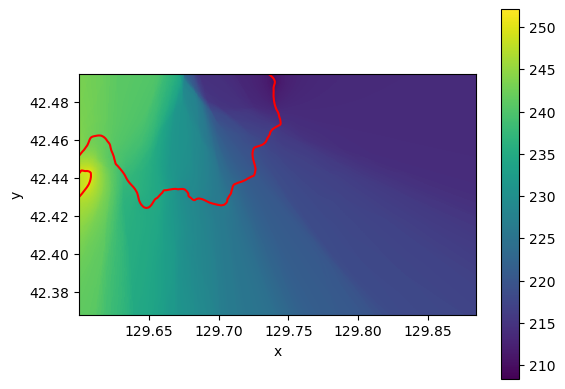

In [97]:
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

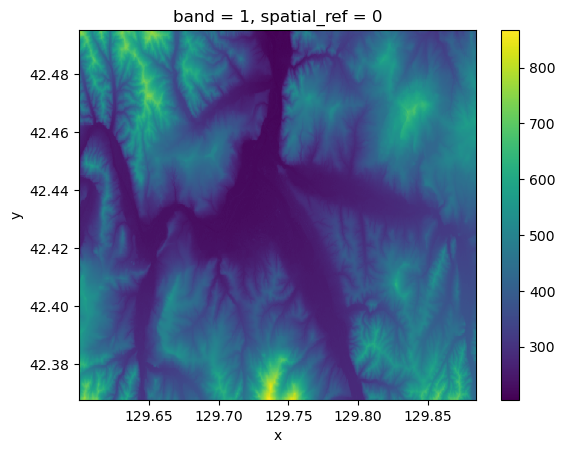

In [92]:
dem.plot()

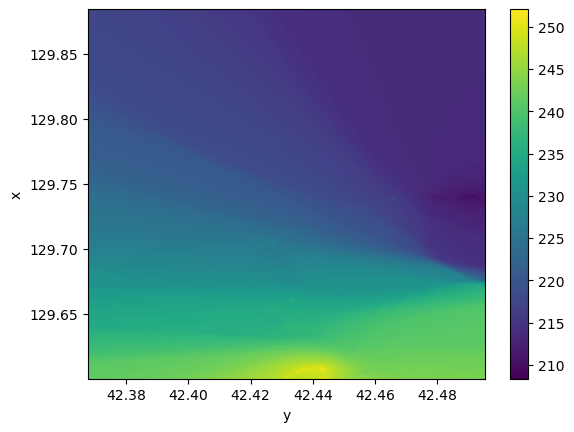

In [44]:
elevation_raster.plot()

In [50]:
elevation_raster_t=elevation_raster.transpose()

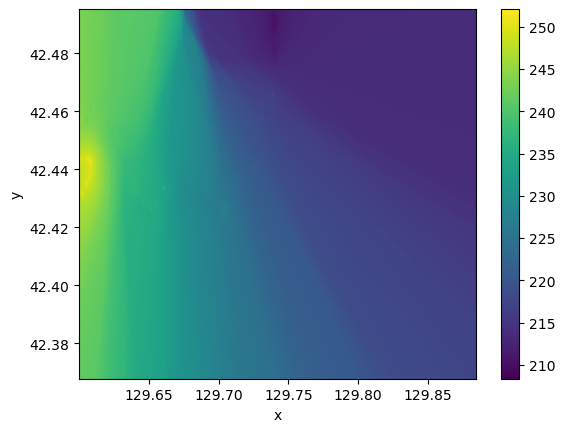

In [51]:
elevation_raster_t.plot()

In [101]:
rem = dem - elevation_raster


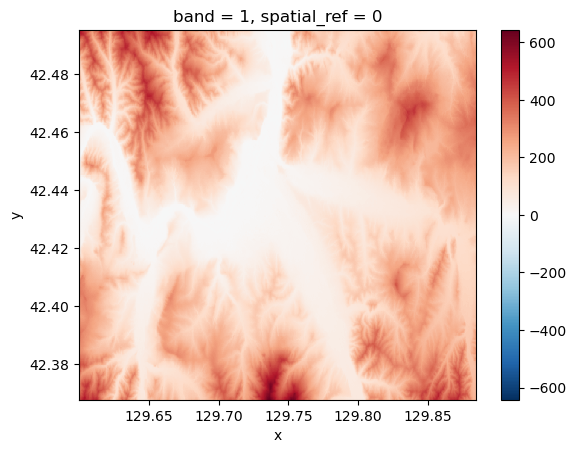

In [102]:
rem.plot()

In [106]:
rem.coords['y']

<xarray.DataArray 'y' (y: 473)>
array([42.495119, 42.494849, 42.49458 , ..., 42.368456, 42.368187, 42.367917])
Coordinates:
  * y            (y) float64 42.5 42.49 42.49 42.49 ... 42.37 42.37 42.37 42.37
    spatial_ref  int64 0

In [107]:
rem_flipped = rem.flip(dim='y')


AttributeError: 'DataArray' object has no attribute 'flip'

In [105]:
rem

<xarray.DataArray (band: 1, y: 473, x: 1054)>
array([[[489.87282227, 497.87565873, 506.87849136, ..., 207.29873199,
         207.29857257, 207.29841391],
        [483.87361662, 488.87648375, 498.87934708, ..., 199.29831309,
         197.2981551 , 197.29799786],
        [475.8744125 , 485.87731077, 498.88020528, ..., 194.29789345,
         191.2977369 , 189.29758108],
        ...,
        [404.63110019, 410.6373333 , 419.64359856, ..., 216.61521252,
         215.61533866, 215.61546408],
        [410.63414086, 417.64033886, 427.64656859, ..., 216.61495347,
         216.6150801 , 216.615206  ],
        [417.63714604, 422.64330917, 428.64950361, ..., 216.61469515,
         218.61482226, 218.61494864]]])
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 129.6 129.6 129.6 129.6 ... 129.9 129.9 129.9 129.9
  * y            (y) float64 42.5 42.49 42.49 42.49 ... 42.37 42.37 42.37 42.37
    spatial_ref  int64 0

## Visualization

In [59]:
from datashader.transfer_functions import shade, stack


In [60]:
colors = ['#f2f7fb', '#81a8cb', '#37123d']


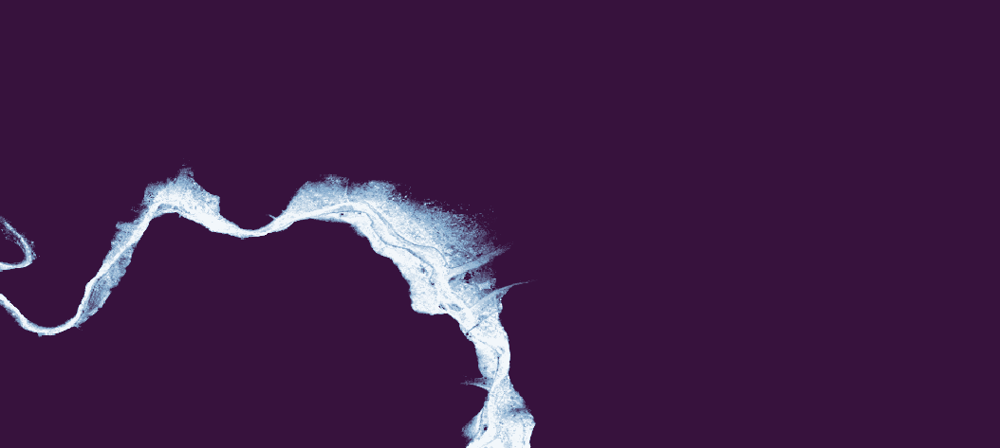

In [104]:
shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear')


In [63]:
print(dem_.rio.crs)


EPSG:4326


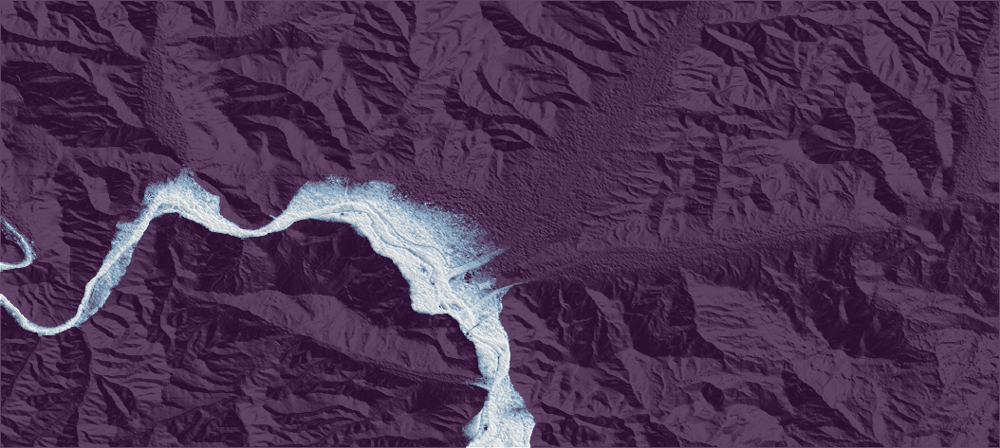

In [62]:
import xrspatial    # Hillshading

a = shade(xrspatial.hillshade(dem_.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')
b = shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)
stack(a, b)


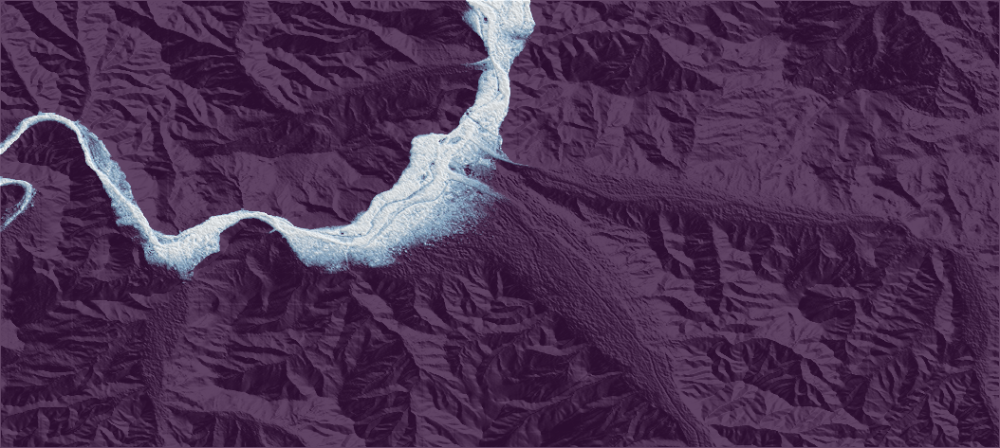

In [65]:
# Flip the data arrays along the y-axis
flipped_dem_ = dem_.isel(y=slice(None, None, -1))
flipped_rem = rem.isel(y=slice(None, None, -1))

# Set the desired EPSG code
desired_epsg = 'EPSG:5179'

# Project the dem_ and rem data arrays
projected_dem_ = flipped_dem_.rio.reproject(desired_epsg)
projected_rem = flipped_rem.rio.reproject(desired_epsg)


# Now you can use the flipped data arrays in your visualization code
a = shade(xrspatial.hillshade(flipped_dem_.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')
b = shade(flipped_rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)
stack(a, b)


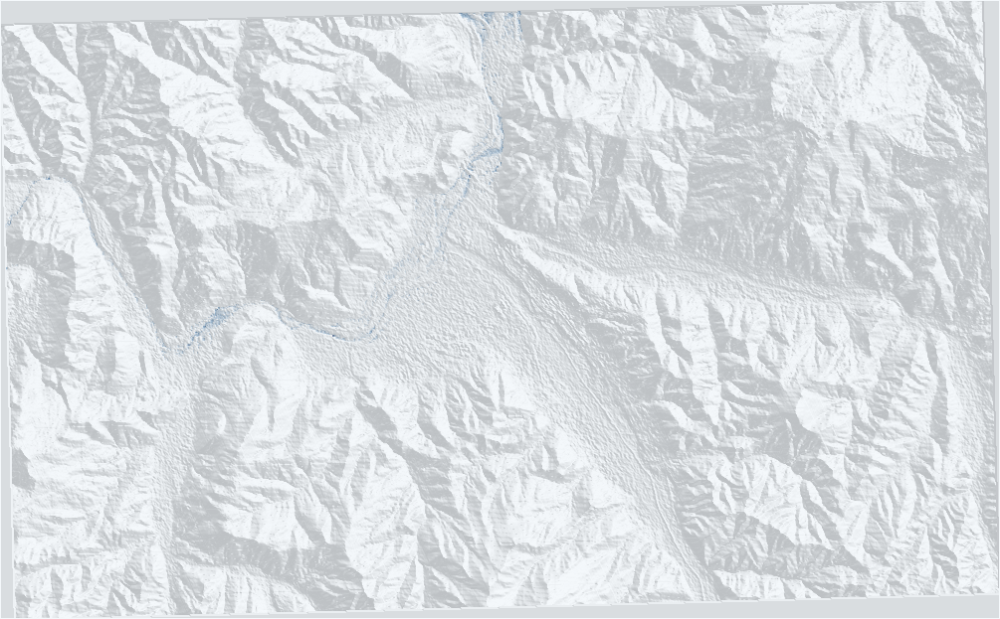

In [77]:
# Re-flip the negated data arrays along the y-axis
corrected_dem_ = negated_dem_.isel(y=slice(None, None, -1))
corrected_rem = negated_rem.isel(y=slice(None, None, -1))

# Now use the corrected data arrays in your visualization code
a = shade(xrspatial.hillshade(corrected_dem_.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')
b = shade(corrected_rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)
stack(a, b)


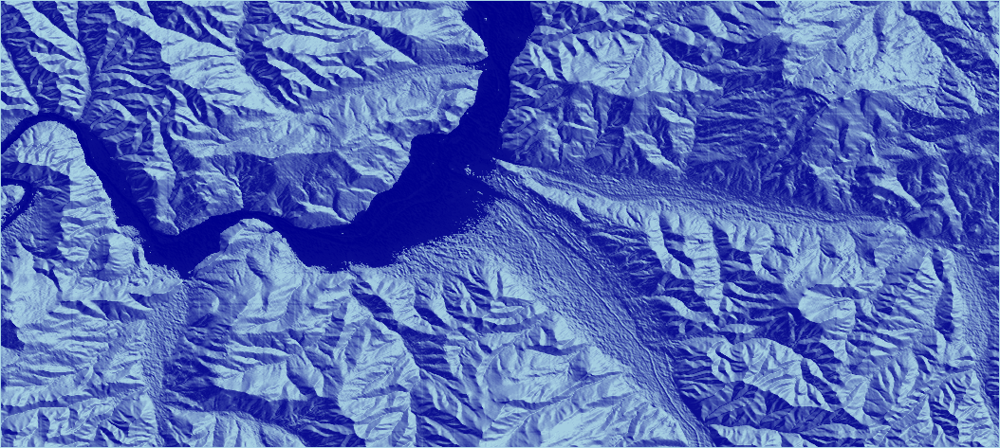

In [69]:
from datashader.utils import export_image
import datashader.transfer_functions as tf

# Stacking the images
stacked_image = stack(a, b)

# Saving the stacked image to a file
export_image(tf.shade(stacked_image), filename='meandering')


In [70]:
# Save the dem_ data array as a GeoTIFF
projected_dem_.rio.to_raster('dem_output.tif')

# Save the rem data array as a GeoTIFF
projected_rem.rio.to_raster('rem_output.tif')


### 3d visualization

ValueError: Argument Z must be 2-dimensional.

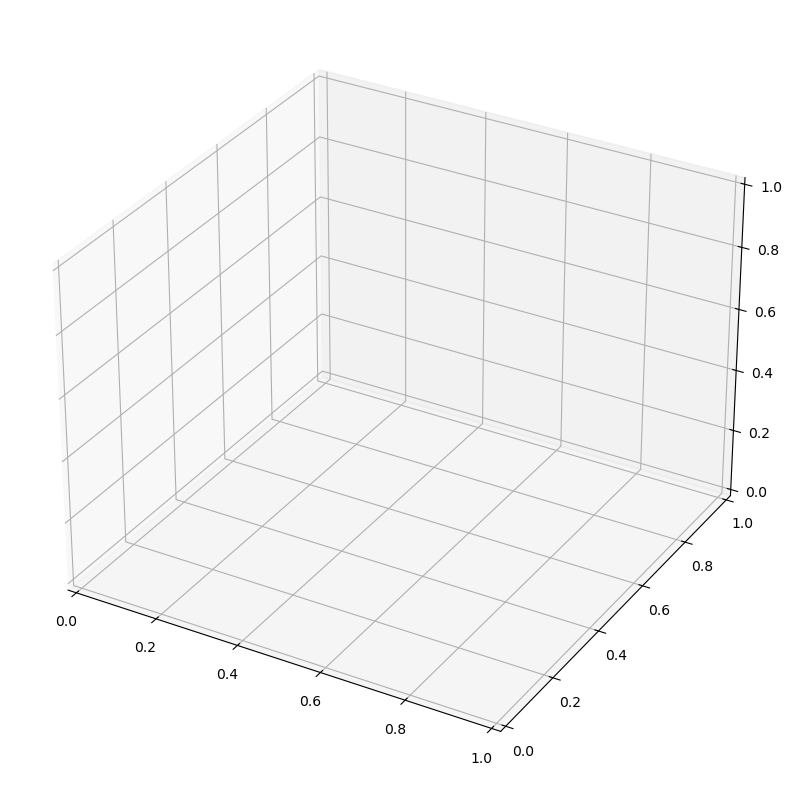

In [71]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming projected_dem_ and projected_rem are your data arrays
dem_data = projected_dem_.values
rem_data = projected_rem.values

# Create x, y coordinates
x = np.arange(dem_data.shape[1])
y = np.arange(dem_data.shape[0])
x, y = np.meshgrid(x, y)

# Create a new figure
fig = plt.figure(figsize=(10, 10))

# Create a 3D axis
ax = fig.add_subplot(111, projection='3d')

# Plot the DEM data
dem_surface = ax.plot_surface(x, y, dem_data, cmap='gray', rstride=10, cstride=10, alpha=0.8)

# Optionally, plot the rem data
# rem_surface = ax.plot_surface(x, y, rem_data, cmap='viridis', rstride=10, cstride=10, alpha=0.8)

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Elevation')
ax.set_title('3D Plot of DEM Data')

# Show the plot
plt.show()


In [72]:
print(dem_data.shape)


(1, 623, 1005)


(623, 1005)


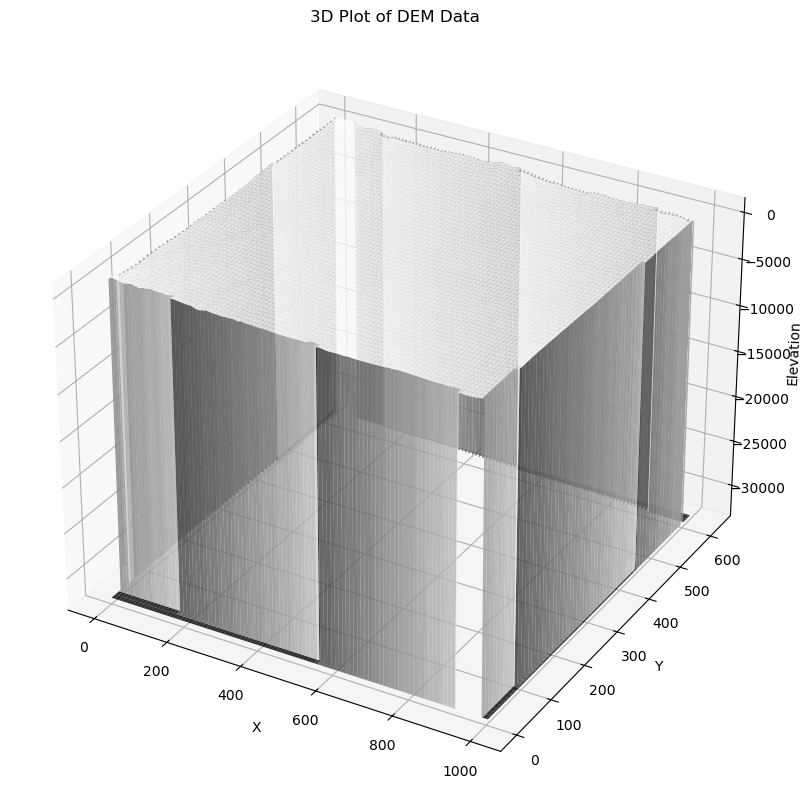

In [73]:
# Squeeze out singleton dimensions
dem_data = projected_dem_.squeeze().values

# Check the new shape of dem_data
print(dem_data.shape)  # Should print (623, 1005)

# Create a new figure
fig = plt.figure(figsize=(10, 10))

# Create a 3D axis
ax = fig.add_subplot(111, projection='3d')

# Create x, y coordinates
x = np.arange(dem_data.shape[1])
y = np.arange(dem_data.shape[0])
x, y = np.meshgrid(x, y)

# Plot the DEM data
dem_surface = ax.plot_surface(x, y, dem_data, cmap='gray', rstride=10, cstride=10, alpha=0.8)

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Elevation')
ax.set_title('3D Plot of DEM Data')

# Show the plot
plt.show()
